In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!git clone https://github.com/ultralytics/yolov5  # clone repo

Cloning into 'yolov5'...
remote: Enumerating objects: 14601, done.
remote: Counting objects: 100% (155/155), done.
remote: Compressing objects: 100% (103/103), done.
remote: Total 14601 (delta 95), reused 101 (delta 52), pack-reused 14446
Receiving objects: 100% (14601/14601), 13.56 MiB | 32.37 MiB/s, done.
Resolving deltas: 100% (10066/10066), done.


In [2]:
#!pip install roboflow

%cd yolov5

from roboflow import Roboflow
rf = Roboflow(api_key="oa8agbj4cGuh3zte6w4F")
project = rf.workspace("roboflow-workspace-znzul").project("logo-invoice-detection")
dataset = project.version(2).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Logo-Invoice-Detection-2 in yolov5pytorch:: 100%|██████████| 1812/1812 [00:00<00:00, 2480.84it/s]


In [4]:
!pip install -qr requirements.txt  # install dependencies

/content/yolov5
     |████████████████████████████████| 1.6 MB 5.1 MB/s 


In [19]:
import torch

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.12.1+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [3]:
%cat {dataset.location}/data.yaml

names:
- logo
nc: 1
roboflow:
  license: CC BY 4.0
  project: logo-invoice-detection
  url: https://universe.roboflow.com/roboflow-workspace-znzul/logo-invoice-detection/dataset/2
  version: 2
  workspace: roboflow-workspace-znzul
test: ../test/images
train: Logo-Invoice-Detection-2/train/images
val: Logo-Invoice-Detection-2/valid/images


In [8]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [9]:
%%writetemplate /content/yolov5/models/yolov5s_logo_detection.yaml

# Parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]


In [4]:
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/yolov5s_logo_detection.yaml --weights '' --name yolov5s_logo_results  --cache

/content/yolov5
train: weights=, cfg=./models/yolov5s_logo_detection.yaml, data=/content/yolov5/Logo-Invoice-Detection-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_logo_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-228-g6ae3dff Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.

In [6]:
%load_ext tensorboard
%tensorboard --logdir runs/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [13]:
from IPython.display import Image, display

GROUND TRUTH TRAINING DATA:


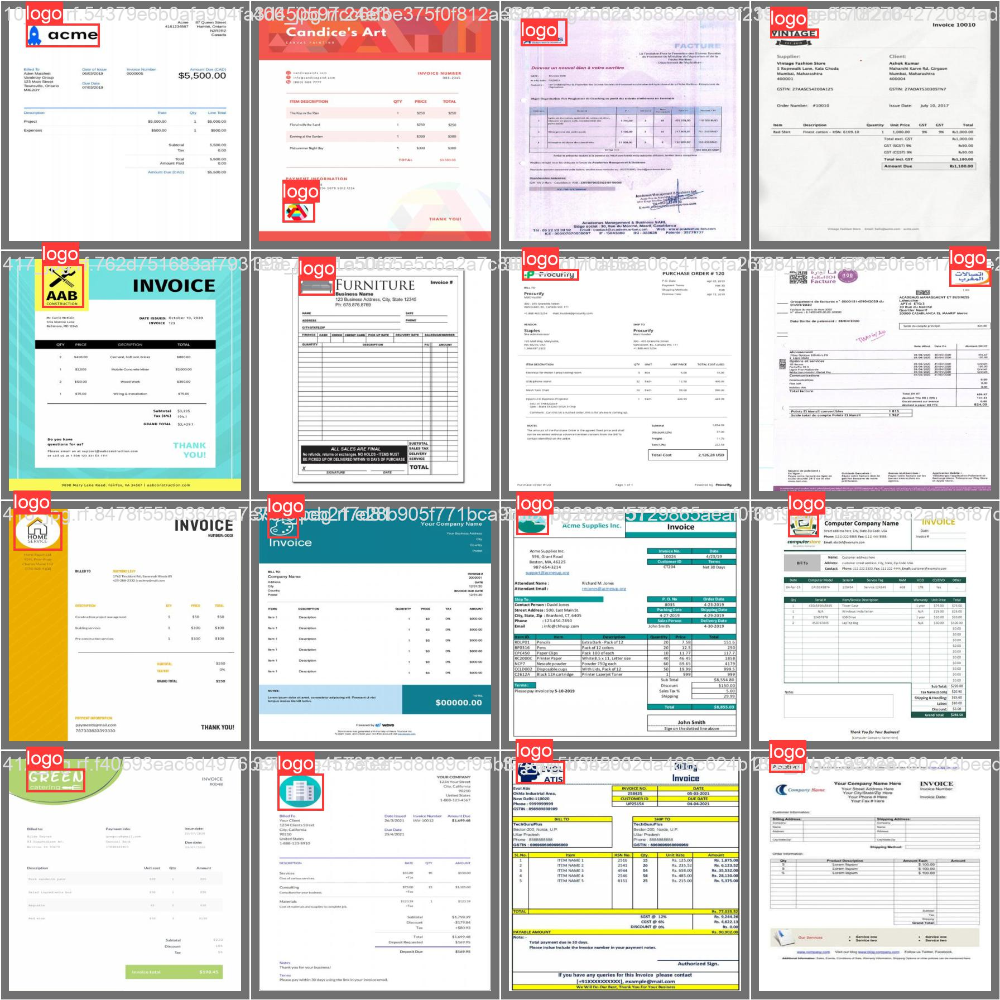

In [9]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_logo_results4/val_batch0_labels.jpg', width=900)

In [28]:
!python detect.py --weights runs/train/yolov5s_logo_results4/weights/best.pt --img 416 --conf 0.4 --source {dataset.location}/test/images --save-txt --save-conf

detect: weights=['runs/train/yolov5s_logo_results4/weights/best.pt'], source=/content/yolov5/Logo-Invoice-Detection-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-228-g6ae3dff Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s_logo_detection summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/36 /content/yolov5/Logo-Invoice-Detection-2/test/images/11_jpg.rf.d7a8428afc0ab8cc9c33470af6f25997.jpg: 416x416 1 logo, 8.2ms
image 2/36 /content/yolov5/Logo-Invoice-Detection-2/test/images/146_jpg.rf.d19c9f1eddfdcd414ad30076fd5731a1.jpg: 416x416 (no detections), 8.2ms
ima

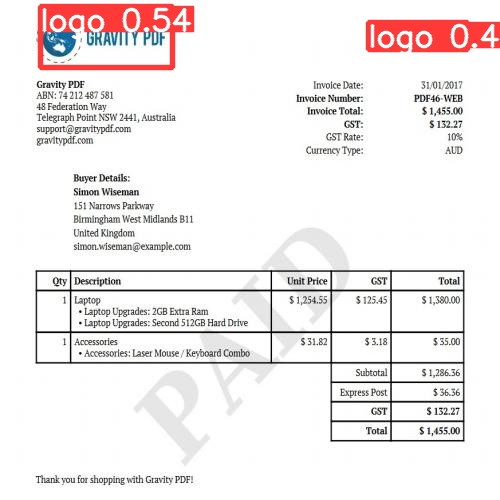

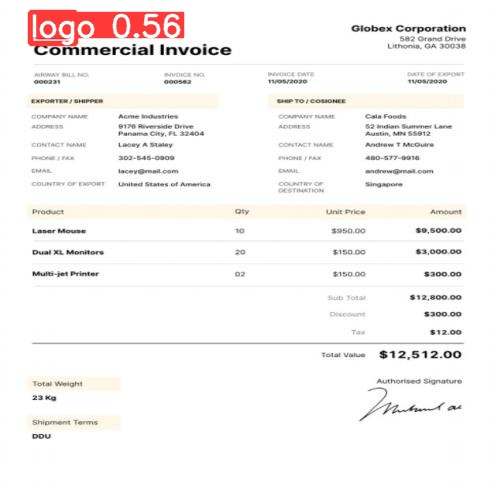

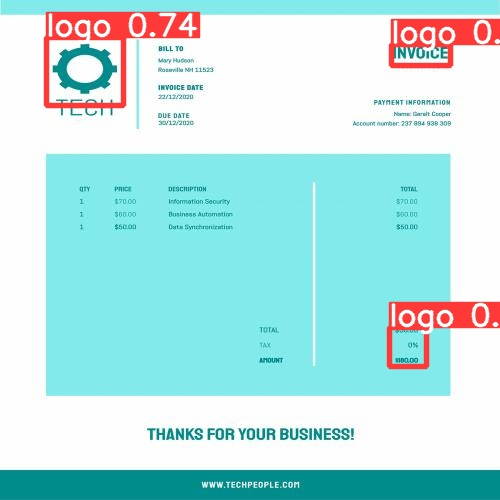

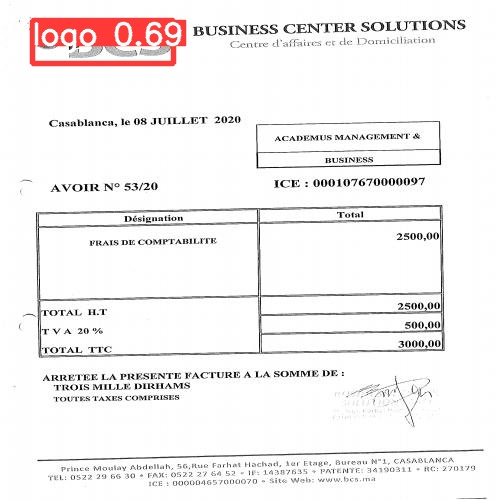

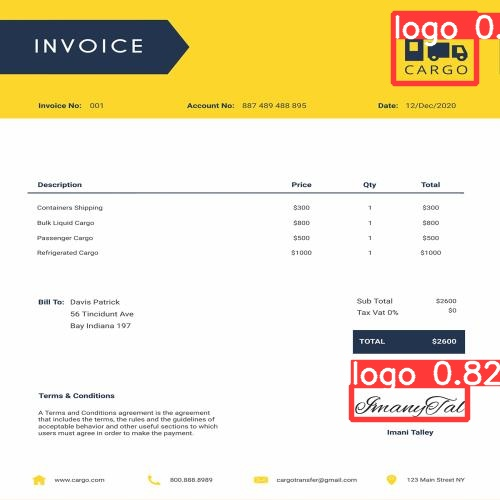

...

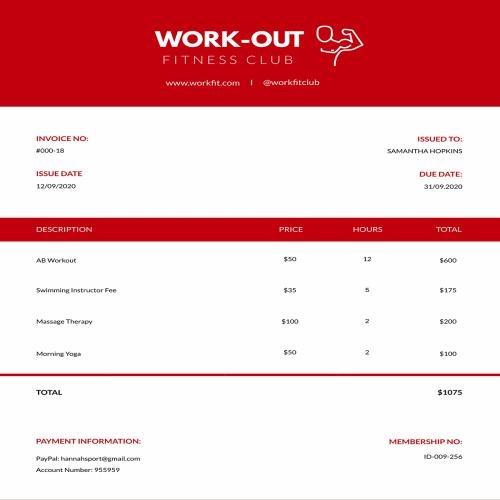

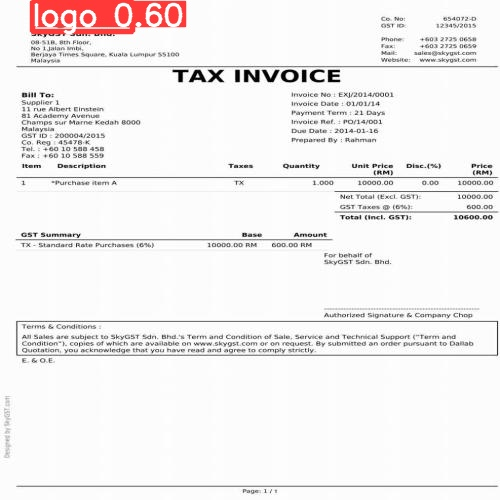

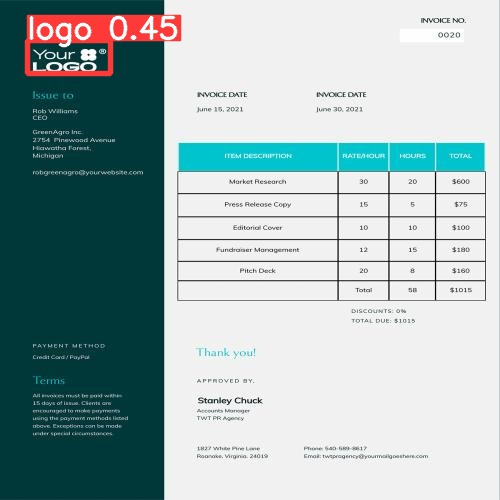

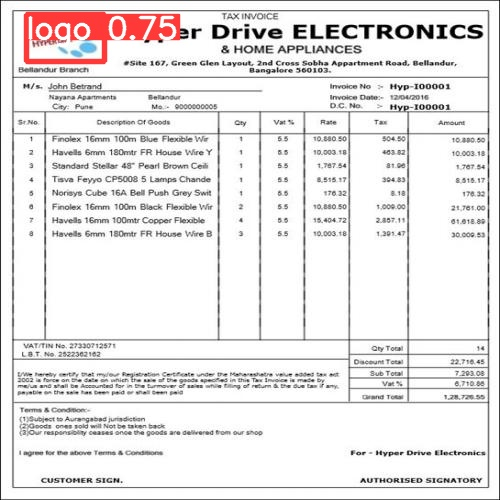

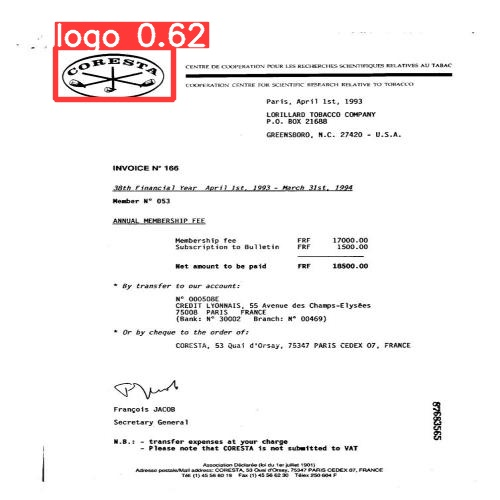

In [29]:
import glob

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): 
    display(Image(filename=imageName))
    print("\n")